<a href="https://colab.research.google.com/github/kwdaisuke/LeWagon/blob/main/MathNotebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Math for Data Science

In [13]:
# !pip install d2l
# !pip install -U pandas_profiling

# import os
# os.kill(os.getpid(), 9)

## Part 1 Theoretical explanation

### Differential calculus
The best constant approximation for the rate of change

![](https://upload.wikimedia.org/wikipedia/commons/3/37/Graph_of_sliding_derivative_line_no_text.gif)



<div>
<img src="https://ds055uzetaobb.cloudfront.net/image_optimizer/f1aad8cb82a3d4acf67f2fc6523d8fe10677b478.gif" width="400"/>
</div>


<div>
<img src="https://mathinsight.org/media/image/image/partial_derivative_as_slope.png" width="400"/>
</div>

$L = lim_{h→0}\frac{f(a+h) - f(a)}{h}$

- Power rules \
$\frac{d}{dx}x^a=ax^{a-1}$ 

- Exponential and logarthm \
$\frac{d}{dx}e^x=e^x$ \
$\frac{d}{dx}a^x=a^xln(a)$

- Sum rule \
$(af+ \beta g)` = af` + \beta g`$

- Product rule \
$(fg)` = f`g +fg`$

- Quotient rule \
$(\frac{f}{g})` = \frac{f`g-fg`}{g^2}$

In [14]:
from sympy import *

# Declare 'x' to SymPy
x, y = symbols('x, y')

# Now just use Python syntax to declare function
f = x**2

# Calculate the derivative of the function
dx_f = diff(f)
dx_f # prints 2*x

2*x

In [15]:
f = x**3 + 5*x + 2; f

x**3 + 5*x + 2

In [16]:
Answer = "8" #@param ["3*x**2 + 5", "8", "3*x**2 + 5 + 2"]
if Answer == "3x**2 + 5":
  f = x**3 + 5*x + 2
  print("Correct!")
else:
  print("Try again :(")

Try again :(


In [17]:
f = exp(x); f

exp(x)

In [18]:
Answer = "2e" #@param ["e", "e**x", "2e", "x"]
if Answer == "e**x":
  print("Correct!")
  print(diff(f))
else:
  print("Try again :(")

Try again :(


In [19]:
f = 2*x**3 + 3*y**3; f

2*x**3 + 3*y**3

In [20]:
Answer = "9*y**2" #@param ["6*x**2", "9*y**2", "6*x**3+9*y**2", "3*x**2"]
if Answer == "6*x**2":
  print("Correct!")
  print(diff(f))
else:
  print("Try again :(")

Try again :(


### Integral Calculus

 an integral assigns numbers to functions in a way that describes displacement, area, volume, and other concepts that arise by combining infinitesimal data

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/5/54/Integral_riemann_animada.gif" width="400"/>
</div>

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/0/0a/Riemann_Integration_and_Darboux_Upper_Sums.gif/600px-Riemann_Integration_and_Darboux_Upper_Sums.gif" width="400"/>
</div>


#### Application: EM Algorithm

${\displaystyle L({\boldsymbol {\theta }};\mathbf {X} )=p(\mathbf {X} \mid {\boldsymbol {\theta }})=\int p(\mathbf {X} ,\mathbf {Z} \mid {\boldsymbol {\theta }})\,d\mathbf {Z} =\int p(\mathbf {Z} \mid \mathbf {X} ,{\boldsymbol {\theta }})p(\mathbf {X} \mid {\boldsymbol {\theta }})\,d\mathbf {Z} }$ \\
${\displaystyle Q({\boldsymbol {\theta }}\mid {\boldsymbol {\theta }}^{(t)})=\operatorname {E} _{\mathbf {Z} \mid \mathbf {X} ,{\boldsymbol {\theta }}^{(t)}}\left[\log L({\boldsymbol {\theta }};\mathbf {X} ,\mathbf {Z} )\right]\,}$

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/6/69/EM_Clustering_of_Old_Faithful_data.gif" width="400"/>
</div>

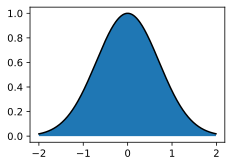

In [21]:
%matplotlib inline
import torch
from IPython import display
from mpl_toolkits import mplot3d
from d2l import torch as d2l

x = torch.arange(-2, 2, 0.01)
f = torch.exp(-x**2)

d2l.set_figsize()
d2l.plt.plot(x, f, color='black')
d2l.plt.fill_between(x.tolist(), f.tolist())
d2l.plt.show()

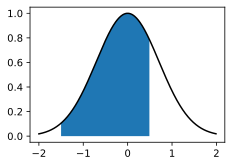

In [22]:
x = torch.arange(-2, 2, 0.01)
f = torch.exp(-x**2)

d2l.set_figsize()
d2l.plt.plot(x, f, color='black')
d2l.plt.fill_between(x.tolist()[50:250], f.tolist()[50:250])
d2l.plt.show()

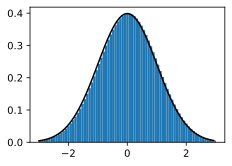

'approximation: 0.9973338950896181, truth: True'

In [23]:
from scipy import stats

distribution = "normal" #@param ["normal", "gamma", "uniform", "laplace", "double weibull"] {allow-input: true}
epsilon = 0.08013 #@param {type:"slider", min:0, max:1, step:0.00001}

min = -3 #@param {type:"number"}
max = 3 #@param {type:"number"}

x = torch.arange(min, max, epsilon)

#f = x / (1 + x**2)
if distribution == "normal":
  f=torch.tensor(stats.norm(0, 1).pdf(x))
elif distribution == "gamma":
  f = torch.tensor(stats.gamma.pdf(x, 0.6))
elif distribution == "uniform":
  f = torch.tensor(stats.uniform.pdf(x))
elif distribution == "laplace":
  f = torch.tensor(stats.laplace.pdf(x))
elif distribution == "double weibull":
  f = torch.tensor(stats.dweibull.pdf(x, 2.07))
approx = torch.sum(epsilon * f)
#true = torch.log(torch.tensor([5.])) / 2

d2l.set_figsize()
d2l.plt.bar(x, f, width=epsilon, align='edge')
d2l.plt.plot(x, f, color='black')
d2l.plt.show()

f'approximation: {approx}, truth: {true}'

### Linear Algebra

Linear algebra is the branch of mathematics concerning linear equations such as:

${\displaystyle a_{1}x_{1}+\cdots +a_{n}x_{n}=b,}{\displaystyle a_{1}x_{1}+\cdots +a_{n}x_{n}=b,}$
linear maps such as:

${\displaystyle (x_{1},\ldots ,x_{n})\mapsto a_{1}x_{1}+\cdots +a_{n}x_{n},}$
and their representations in vector spaces and through matrices.

![](https://thumbs.gfycat.com/CooperativeQuerulousFirefly.webp)

![](https://thumbs.gfycat.com/VeneratedSpitefulFrilledlizard.webp)

In [24]:
import numpy as np
from numpy import random
x = np.arange(1, 4)
y = np.arange(6, 9)
A = np.arange(1, 10).reshape(3, 3)
B = random.randint(1, 10, (3, 3))

print("x: ", x)
print("y: ", y)
print("A: ", A)
print("B: ", B)

x:  [1 2 3]
y:  [6 7 8]
A:  [[1 2 3]
 [4 5 6]
 [7 8 9]]
B:  [[6 1 4]
 [8 4 1]
 [3 7 8]]


In [25]:
# below two are the same
print(np.transpose(A))
print(A.T)

[[1 4 7]
 [2 5 8]
 [3 6 9]]
[[1 4 7]
 [2 5 8]
 [3 6 9]]


In [26]:
print("Inner product of x and y")
print(np.dot(x, y))
print(np.matmul(x, y))
print(x@y)

print("Matrix Multiplication of A and B")
print(np.dot(A, B))
print(np.matmul(A, B))
print(A@B)

Inner product of x and y
44
44
44
Matrix Multiplication of A and B
[[ 31  30  30]
 [ 82  66  69]
 [133 102 108]]
[[ 31  30  30]
 [ 82  66  69]
 [133 102 108]]
[[ 31  30  30]
 [ 82  66  69]
 [133 102 108]]


In [27]:
# Matrix multiplication is not commutative
print(np.matmul(A, B))
print(np.matmul(B, A))

[[ 31  30  30]
 [ 82  66  69]
 [133 102 108]]
[[ 38  49  60]
 [ 31  44  57]
 [ 87 105 123]]


In [28]:
# Broadcasting
print(np.matmul(A, x)) # x is treated as the vertical vector
print(np.matmul(x, A)) # x is treated as the horizontal vector

[14 32 50]
[30 36 42]


In [29]:
a = np.array([1, 0, 1, 0, 1])# 1 dimensional vector with 5 components

# Transposing doesn't affec the outcome
print("Before Transposing: ", a)
print("After Transposing: ", a.T)

# Two dimensional vecotrs are interpretable to distinguish

# Make 2 dimensional horizontal vector 
a = a.reshape(1, -1) # axis = -1 infers the number of components automatically
print("Before Transposing: ", a)
print("After Transposing:\n ", a.T)

Before Transposing:  [1 0 1 0 1]
After Transposing:  [1 0 1 0 1]
Before Transposing:  [[1 0 1 0 1]]
After Transposing:
  [[1]
 [0]
 [1]
 [0]
 [1]]


In [30]:
from numpy import linalg as LA

In [31]:
# Determinant
print(LA.det(A))
print(LA.det(B))

# Inverse Matrix
print(LA.inv(B)) # A is singular matrix, thus non-invertible

0.0
264.99999999999994
[[ 0.09433962  0.0754717  -0.05660377]
 [-0.23018868  0.13584906  0.09811321]
 [ 0.16603774 -0.14716981  0.06037736]]


### Gradient Descent Algorithm

![](https://miro.medium.com/max/1400/1*Qfdsh_bJRIJ-Sla4TulrWA.jpeg)

![](https://hackernoon.com/hn-images/0*D7zG46WrdKx54pbU.gif)


Gradient Descent minimize the loss between objective and cost function by taking partial derivatives with respect to each parameter(w, b in this example)

・Gradient \
$\nabla L = (\frac{\partial L}{\partial w} \frac{\partial L}{\partial b})$

・Partial Derivatives \
$\frac{\partial}{\partial w}((y-(wx^2+b)) = -2x^2(-b-wx^2+y)$ \
$\frac{\partial}{\partial b}((y-(wx^2+b)) = -2(-b-wx^2+y)$

・Update parameters \
$w ← w - \eta \frac{\partial f}{\partial w} $ \
$b ← b - \eta \frac{\partial f}{\partial b} $

### Neural Network



<div>
<img src="https://storage.ning.com/topology/rest/1.0/file/get/2808330901?profile=" width="800"/>
</div>



<div>
<img src="https://www.jeremyjordan.me/content/images/2018/01/Screen-Shot-2017-11-07-at-12.53.07-PM.png" width="800"/>
</div>

# *Data Science and STEM Salaries*

<div>
<img src="https://www.espinews.com.ng/wp-content/uploads/2021/05/Tech-company-logo.jpg" width="800"/>
</div>

In [54]:
# Import Python Packages

import numpy as np                        # Matrix calculation
import pandas as pd                       # Data Processing
import matplotlib.pyplot as plt           # Data Visualization
from pandas_profiling import ProfileReport
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

df = pd.read_csv("https://raw.githubusercontent.com/kwdaisuke/LeWagon/main/Levels_Fyi_Salary_Data.csv") ;df.head()   # Import CSV dataset

,timestamp,company,level,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,tag,basesalary,stockgrantvalue,bonus,gender,otherdetails,cityid,dmaid,rowNumber,Masters_Degree,Bachelors_Degree,Doctorate_Degree,Highschool,Some_College,Race_Asian,Race_White,Race_Two_Or_More,Race_Black,Race_Hispanic,Race,Education
0,6/7/2017 11:33:27,Oracle,L3,Product Manager,127000,"Redwood City, CA",1.5,1.5,NaN,107000.0,20000.0,10000.0,NaN,NaN,7392,807.0,1,0,0,0,0,0,0,0,0,0,0,NaN,NaN
1,6/10/2017 17:11:29,eBay,SE 2,Software Engineer,100000,"San Francisco, CA",5.0,3.0,NaN,0.0,0.0,0.0,NaN,NaN,7419,807.0,2,0,0,0,0,0,0,0,0,0,0,NaN,NaN
2,6/11/2017 14:53:57,Amazon,L7,Product Manager,310000,"Seattle, WA",8.0,0.0,NaN,155000.0,0.0,0.0,NaN,NaN,11527,819.0,3,0,0,0,0,0,0,0,0,0,0,NaN,NaN
3,6/17/2017 0:23:14,Apple,M1,Software Engineering Manager,372000,"Sunnyvale, CA",7.0,5.0,NaN,157000.0,180000.0,35000.0,NaN,NaN,7472,807.0,7,0,0,0,0,0,0,0,0,0,0,NaN,NaN
4,6/20/2017 10:58:51,Microsoft,60,Software Engineer,157000,"Mountain View, CA",5.0,3.0,NaN,0.0,0.0,0.0,NaN,NaN,7322,807.0,9,0,0,0,0,0,0,0,0,0,0,NaN,NaN


Top 10 most frequent companies in the dataset

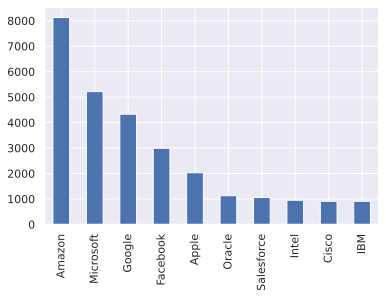

In [111]:
df.company.value_counts()[:10].plot.bar()

GAFAM(Google, Amazon, Facebook, Apple, Microsoft)

In [139]:
GAFAM = df[df.company.isin(["Google", "Amazon","Facebook", "Apple", "Microsoft"])]
GAFAM.groupby("company").mean()

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,cityid,dmaid,rowNumber,Masters_Degree,Bachelors_Degree,Doctorate_Degree,Highschool,Some_College,Race_Asian,Race_White,Race_Two_Or_More,Race_Black,Race_Hispanic
company,,,,,,,,,,,,,,,,,,,
Amazon,227351.741324,7.286500,2.330232,127373.234310,67839.362417,17970.069284,10386.427640,649.465420,39402.419764,0.255968,0.168102,0.020921,0.004307,0.003446,0.184470,0.104603,0.011937,0.009968,0.018213
Apple,277930.226824,7.555720,2.573708,157404.566075,87065.890039,21866.082347,7927.493097,755.594675,35530.785503,0.247535,0.128698,0.068047,0.002959,0.004931,0.167653,0.107495,0.011834,0.002959,0.013807
Facebook,344527.257525,7.131522,1.433244,168470.458194,129307.458528,30121.567224,9228.420067,689.955853,39376.647826,0.242809,0.170234,0.052508,0.008696,0.006020,0.181271,0.122074,0.012375,0.009365,0.022742
Google,283290.300231,6.835970,2.508776,147243.983834,90625.390300,29930.357968,8612.394919,662.227252,36227.653580,0.215012,0.163972,0.060739,0.003233,0.003926,0.152194,0.117090,0.013395,0.011778,0.019861
Microsoft,208501.036426,7.701400,3.728217,135629.028566,37884.950153,25296.926189,11967.781442,693.313842,35699.675038,0.236963,0.171779,0.023006,0.006327,0.005752,0.165069,0.105828,0.011503,0.018213,0.021089


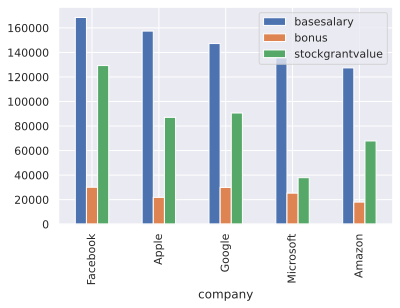

In [138]:
GAFAM.groupby("company").mean()[["basesalary", "bonus", "stockgrantvalue"]].sort_values(ascending=False, by="basesalary").plot.bar()

Job title

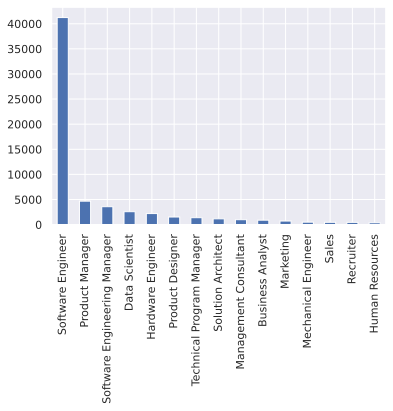

In [91]:
df.title.value_counts().plot.bar()

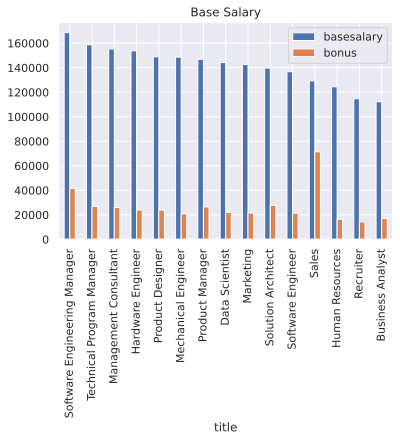

In [141]:
GAFAM.groupby("title").mean()[["basesalary", "bonus"]].sort_values(ascending=False, by="basesalary").plot.bar(title="Base Salary")

In [142]:
import seaborn as sns; sns.set_theme(color_codes=True)
sns.regplot(x="yearsofexperience", y="basesalary", data=df)

In [58]:
sns.regplot(x="yearsatcompany", y="basesalary", data=df)

In [89]:
df[df.basesalary.isin(df.basesalary.nlargest(2))]

,timestamp,company,level,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,tag,basesalary,stockgrantvalue,bonus,gender,otherdetails,cityid,dmaid,rowNumber,Masters_Degree,Bachelors_Degree,Doctorate_Degree,Highschool,Some_College,Race_Asian,Race_White,Race_Two_Or_More,Race_Black,Race_Hispanic,Race,Education
61851,6/12/2018 5:04:06,Squarespace,Senior I,Software Engineer,162000,"New York, NY",7.0,7.0,API Development (Back-End),1620000.0,0.0,0.0,Male,"Lots of vested ISOs, some fresh RSUs, illiquid.",10182,501.0,889,0,0,0,0,0,0,0,0,0,0,NaN,NaN
62351,1/5/2018 13:59:58,Microsoft,64,Product Manager,250000,"Redmond, WA",13.0,13.0,NaN,1659870.0,49850.0,31500.0,NaN,NaN,11521,819.0,213,0,0,0,0,0,0,0,0,0,0,NaN,NaN


In [90]:
df[df.yearsatcompany.isin(df.yearsatcompany.nlargest(1))]

,timestamp,company,level,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,tag,basesalary,stockgrantvalue,bonus,gender,otherdetails,cityid,dmaid,rowNumber,Masters_Degree,Bachelors_Degree,Doctorate_Degree,Highschool,Some_College,Race_Asian,Race_White,Race_Two_Or_More,Race_Black,Race_Hispanic,Race,Education
46988,4/3/2021 11:04:46,Disney,5,Product Designer,102000,"Crapo, MD",69.0,69.0,Interaction Design,100000.0,2000.0,0.0,NaN,Title: Joiooooo,23596,512.0,64028,0,0,0,0,0,0,0,0,0,0,NaN,NaN


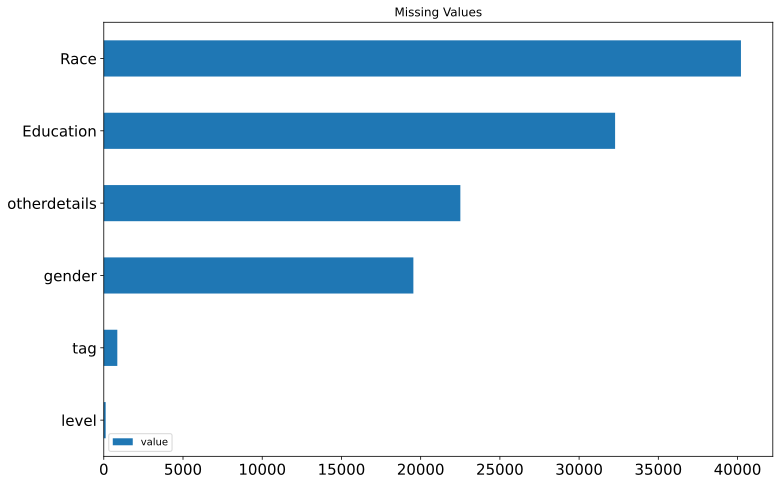

In [33]:
# Find the varibales which has more than 100 missing values, then plot the number of them.
missing_values = pd.DataFrame(df.isnull().sum().sort_values(), columns=["value"]).copy() 
missing_values = missing_values[missing_values.value > 100]
missing_values.plot.barh(figsize=(12, 8), title="Missing Values", fontsize=15)

In [34]:
# Get the variables with missing values
missing_values_df = df[missing_values.index]
# See the statistics in details
profile = ProfileReport(missing_values_df, title="Pandas Profiling Report") ; profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

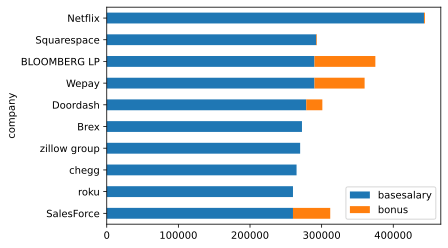

In [35]:
# Select basesalary and bonus with respect to each company, plot in the descending order
df.groupby("company").mean()[["basesalary", "bonus"]].sort_values(ascending=False, by="basesalary")[:10].plot.barh( stacked=True).invert_yaxis()

In [36]:
################## NO NEED TO REMEMBER #################################
import random

# Cost function
def NeuralNetwork(w,x,b):
    return w*x + b

w = random.random()
b = random.random()
lr = 0.000001 # Hyperparameter

x = 353
y = 2

def update_params():
    global w, b
    y_pred = NeuralNetwork(w,x,b)
    derivative_wrt_w = -2*x*(y - y_pred) # partial derivative
    derivative_wrt_b = -2*(y - y_pred) # partial derivative
    w = w - lr*derivative_wrt_w # Update w
    b = b - lr*derivative_wrt_b # Update b

history = []
for epoch in range(100):
    update_params()
    y_hat = NeuralNetwork(w,x,b)
    cost = abs(y - y_hat)
    history.append(cost)
    print(epoch+1, cost)

epsilon = 0.0000000000000001 # Threshold 
y_hat = NeuralNetwork(w,x,b) # prediction of y
(y - y_hat) < epsilon # Check if the prediction is correct
##########################################################################

1 112.45342563457741
2 84.42778289792803
3 63.3866908441064
4 47.58945975193821
5 35.729214592560176
6 26.82477973180233
7 20.139508127042554
8 15.120339911621006
9 11.35204879884682
10 8.522891197198215
11 6.398816253032477
12 4.804103266451723
13 3.606824650386624
14 2.7079318110172705
15 2.033061045075546
16 1.526381571421818
17 1.1459767561920726
18 0.8603764290138844
19 0.6459534153750441
20 0.48496890519527547
21 0.36410495464250925
22 0.2733627178465028
23 0.2052352613047974
24 0.15408652948241608
25 0.11568508460480853
26 0.08685404781959782
27 0.06520828202199791
28 0.04895707397647575
29 0.03675599200005841
30 0.027595663673803728
31 0.020718272373018376
32 0.015554864532214552
33 0.011678281193496343
34 0.008767819954452971
35 0.006582703865404049
36 0.004942162408068107
37 0.00371047669272917
38 0.0027857516913671887
39 0.0020914866548444877
40 0.00157024635072478
41 0.0011789095551968387
42 0.0008851017158506558
43 0.0006645166662262447
44 0.0004989058226692045
45 0.000374

True

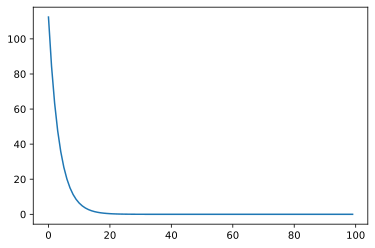

In [37]:
import pandas as pd
pd.Series(history).plot()

In [70]:
# Clean data
df_cleaned= df[df.columns.difference(missing_values.index)].dropna()            # Select variables without missing values(>100), drop missing values(=<100)
df_cleaned = df_cleaned[df_cleaned.basesalary>0]                                # Select rows whose basesalary is larger than 0 
df_cleaned = df_cleaned[(df_cleaned.bonus>0) & (df_cleaned.stockgrantvalue>0)]  # Select rows whose bonus and stockgrantvalue is larger than 0

# y = output, X = input. We would like to predict basesalary with other information we obtain in the dataset
y, X = df_cleaned.basesalary, \
       df_cleaned[["totalyearlycompensation","yearsofexperience", "yearsatcompany", "stockgrantvalue",  "bonus", "cityid", "company", "title"]]

# Encoding categorical variables(necessary procedure as these are required to be numerical representation = string values are not acceptable in Neural Network)
from sklearn.preprocessing import LabelEncoder
X.company = LabelEncoder().fit_transform(X.company)
X.title = LabelEncoder().fit_transform(X.title)

In [76]:
df.columns.values

array(['timestamp', 'company', 'level', 'title',
       'totalyearlycompensation', 'location', 'yearsofexperience',
       'yearsatcompany', 'tag', 'basesalary', 'stockgrantvalue', 'bonus',
       'gender', 'otherdetails', 'cityid', 'dmaid', 'rowNumber',
       'Masters_Degree', 'Bachelors_Degree', 'Doctorate_Degree',
       'Highschool', 'Some_College', 'Race_Asian', 'Race_White',
       'Race_Two_Or_More', 'Race_Black', 'Race_Hispanic', 'Race',
       'Education'], dtype=object)

In [48]:
################## NO NEED TO REMEMBER #################################
W = np.random.uniform(low=-0.08, high=0.08, size=(8, 1)).astype('float32')
b = np.zeros(shape=(1,)).astype('float32')

mean = X.mean()
std = X.std()

X = (X - mean)/std

def train(x, y, eps=0.3):
    global W, b
    
    batch_size = x.shape[0]
    
    # Prediction
    y_hat =np.matmul(x, W) + b # shape: (batch_size, output dimension)
    y_hat = np.squeeze(y_hat)

    # Evaluate the cost function
    cost = (y - y_hat).sum().mean()
    delta = (y_hat - y) # shape: (batch_size, output dimension)
    
    # Update parameters
    dW = np.matmul(x.T, delta) / batch_size # shape: (input dimension, output dimension)
    db = np.matmul(np.ones(shape=(batch_size,)), delta) / batch_size # shape: (output dimension,)

    W -= eps * dW[:, np.newaxis]
    b -= eps * db

    return cost

history=  []
for epoch in range(100):
    cost = train(X.values, y.values)
    history.append(cost)
    print(epoch + 1, cost)
##########################################################################

1 5479116928.999999
2 3835381821.5625
3 2684767303.6249995
4 1879337026.5312498
5 1315535918.46875
6 920875200.0937498
7 644612754.4999996
8 451228784.8749997
9 315860349.7499997
10 221102330.62499967
11 154771373.62499964
12 108340161.87499963
13 75837855.49999963
14 53086699.18749961
15 37160832.499999605
16 26012324.937499605
17 18208885.062499568
18 12746018.999999572
19 8922184.562499572
20 6245443.187499572
21 4371609.687499547
22 3060155.3124995604
23 2142137.249999542
24 1499581.8749995194
25 1049449.499999527
26 734471.3749995213
27 513986.687499512
28 359933.7499995213
29 251695.81249949336
30 176101.0624994915
31 123413.81249948032
32 86189.1249994915
33 60418.18749948032
34 42092.187499482185
35 29493.06249947287
36 20902.74999947846
37 14603.187499471009
38 10021.687499474734
39 7158.24999945052
40 4867.499999461696
41 3149.4374994561076
42 2004.0624994356185
43 1431.3749994523823
44 858.6874994300306
45 858.6874994337559
46 858.6874994505197
47 858.6874994356185
48 858.68

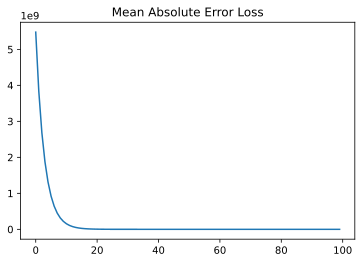

In [49]:
import pandas as pd
pd.Series(history).plot(title="Mean Absolute Error Loss")

In [41]:
########################## ALL YOU NEED ###################################
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

model = tf.keras.Sequential([
  layers.Normalization(axis=-1),
  layers.Dense(units=1)])

model.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.1, decay=1e-2, momentum=0.9, nesterov=True,clipnorm=100),
    loss='mean_absolute_error')
history = model.fit(X, y, epochs=20)
##########################################################################

Epoch 1/20
1146/1146 [==============================] - 2s 1ms/step - loss: 149317.5312
Epoch 2/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149201.8906
Epoch 3/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149151.7969
Epoch 4/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149118.7344
Epoch 5/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149093.7812
Epoch 6/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149074.0625
Epoch 7/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149057.6875
Epoch 8/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149043.4688
Epoch 9/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149030.8594
Epoch 10/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149020.0781
Epoch 11/20
1146/1146 [==============================] - 1s 1ms/step - loss: 149010.0781
Epoch 12/20
1146/1146 [=======

In [50]:
import pandas as pd
pd.Series(history.history["loss"]).plot(title="Mean Absolute Error Loss")

AttributeError: ignored

In [43]:
########################## ALL YOU NEED ###################################
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

model = tf.keras.Sequential([
  layers.Normalization(axis=-1),
  layers.Dense(64, activation="relu"),
    layers.Dense(64, activation="relu"),
      layers.Dense(64, activation="relu"),
  layers.Dense(units=1)])

model.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.1, decay=1e-2, momentum=0.9, nesterov=True,clipnorm=1),
    loss='mean_absolute_error')
history = model.fit(X, y, epochs=20)
##########################################################################

Epoch 1/20
1146/1146 [==============================] - 2s 2ms/step - loss: 8679.5996
Epoch 2/20
1146/1146 [==============================] - 2s 2ms/step - loss: 2463.1482
Epoch 3/20
1146/1146 [==============================] - 2s 2ms/step - loss: 2380.1707
Epoch 4/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2347.7300
Epoch 5/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2331.6716
Epoch 6/20
1146/1146 [==============================] - 2s 2ms/step - loss: 2317.0391
Epoch 7/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2310.8606
Epoch 8/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2303.7449
Epoch 9/20
1146/1146 [==============================] - 2s 2ms/step - loss: 2299.8313
Epoch 10/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2293.8572
Epoch 11/20
1146/1146 [==============================] - 2s 1ms/step - loss: 2289.5562
Epoch 12/20
1146/1146 [=============================

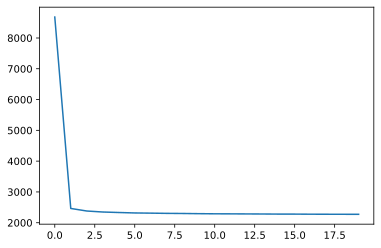

In [44]:
import pandas as pd
pd.Series(history.history["loss"]).plot(title="Mean Absolute Error Loss")

## Reference

**[Data Source]**
- Kaggle: Data Science and STEM Salaries(https://www.kaggle.com/jackogozaly/data-science-and-stem-salaries)

**[Book]**
- Essential Math for Data Science(https://www.amazon.co.jp/-/en/Hadrien-Jean/dp/1098115562)
- Mathematics for Machine Learning https://www.google.com/search?q=math+for+machine+learning&rlz=1C1QABZ_jaJP941JP942&oq=math+for+machine+learning&aqs=chrome..69i57j46i512j0i512l5j69i60.3376j0j1&sourceid=chrome&ie=UTF-8
- Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython 2nd Edition(https://www.amazon.com/Python-Data-Analysis-Wrangling-IPython/dp/1491957662)

**[Video]**
- 3Blue1Brown The essence of calculus https://www.youtube.com/watch?v=WUvTyaaNkzM&t=280s
- Stats Quest with Josh Starmer https://www.youtube.com/channel/UCtYLUTtgS3k1Fg4y5tAhLbw 

**[Articles]**
- Gradient Descent from Scratch https://towardsdatascience.com/gradient-descent-from-scratch-e8b75fa986cc
- Introduction to Machine Learning Interviews Book
 https://huyenchip.com/ml-interviews-book/